In [23]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.offline as pyo
import numpy as np

In [4]:
df = pd.read_csv("gdp.csv")

In [5]:
df.head()

,Country Name,Country Code,Year,Value
0,Arab World,ARB,1968,2.576068e+10
1,Arab World,ARB,1969,2.843420e+10
2,Arab World,ARB,1970,3.138550e+10
3,Arab World,ARB,1971,3.642691e+10
4,Arab World,ARB,1972,4.331606e+10


In [6]:
df.isnull().sum()

Country Name    0
Country Code    0
Year            0
Value           0
dtype: int64

In [7]:
df.rename(columns = {'Country Name':'Country_Name' , 'Country Code' : 'Country_Code'} , inplace = True)

In [8]:
df.head()

,Country_Name,Country_Code,Year,Value
0,Arab World,ARB,1968,2.576068e+10
1,Arab World,ARB,1969,2.843420e+10
2,Arab World,ARB,1970,3.138550e+10
3,Arab World,ARB,1971,3.642691e+10
4,Arab World,ARB,1972,4.331606e+10


C:\Users\LAKSHAY JAIN\Downloads\CODING\jupyter\Lib\site-packages\pandas\plotting\_matplotlib\core.py:580: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



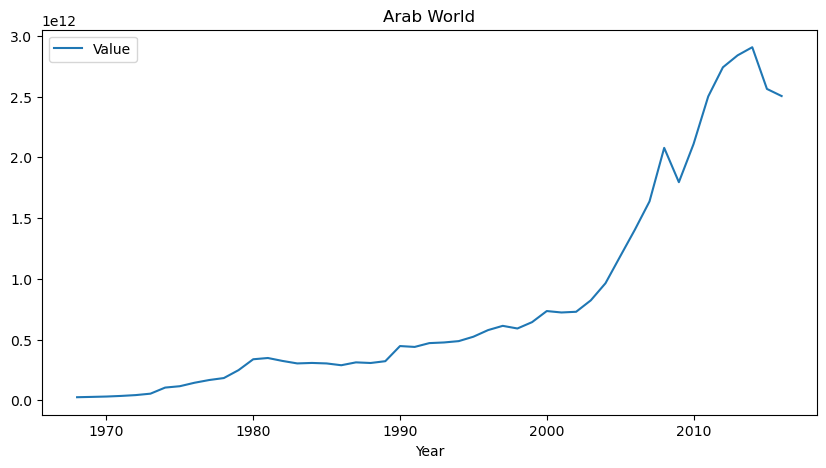

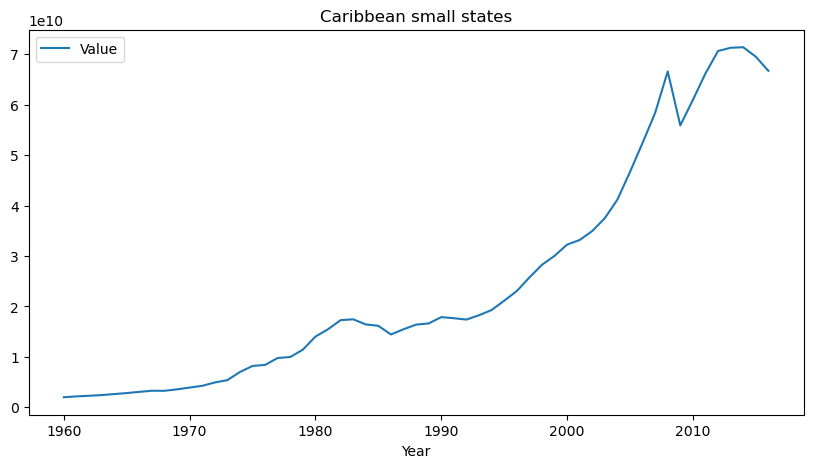

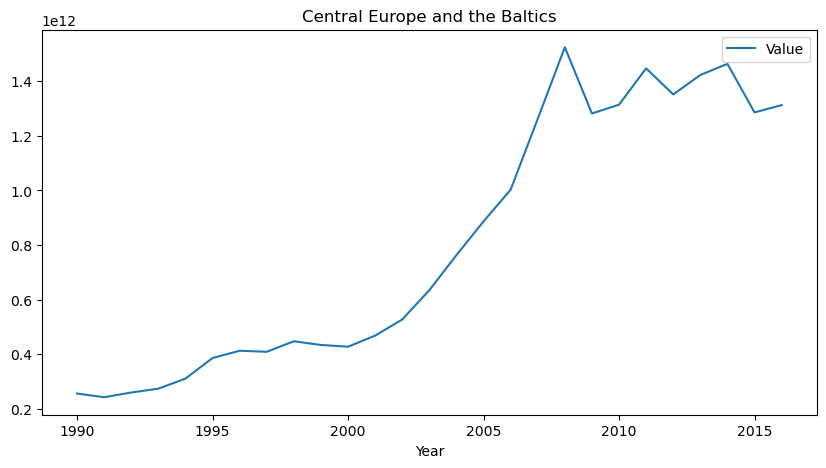

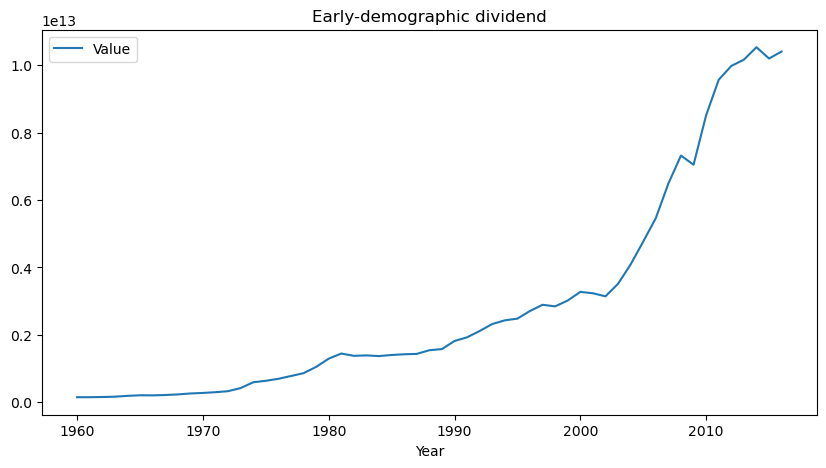

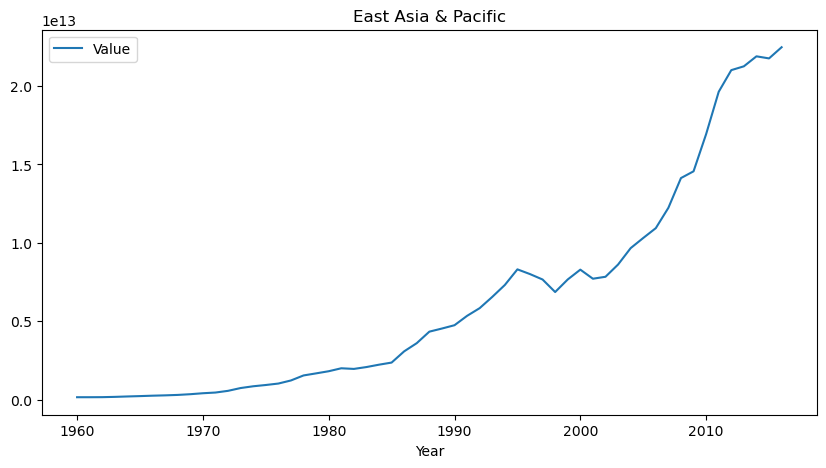

...

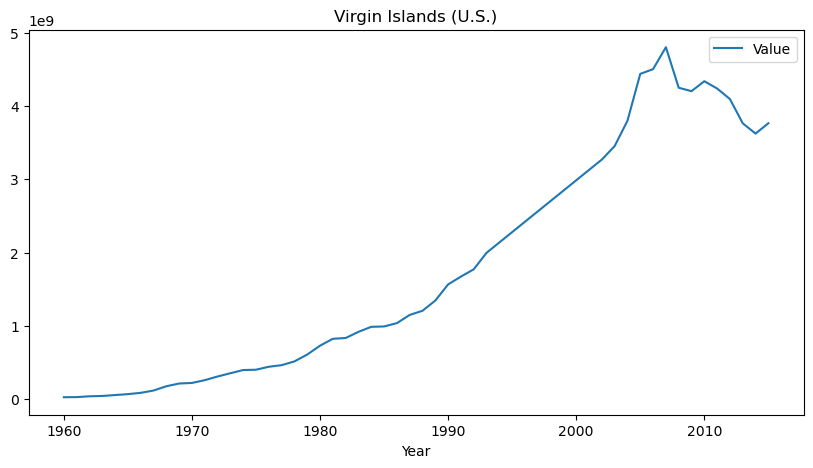

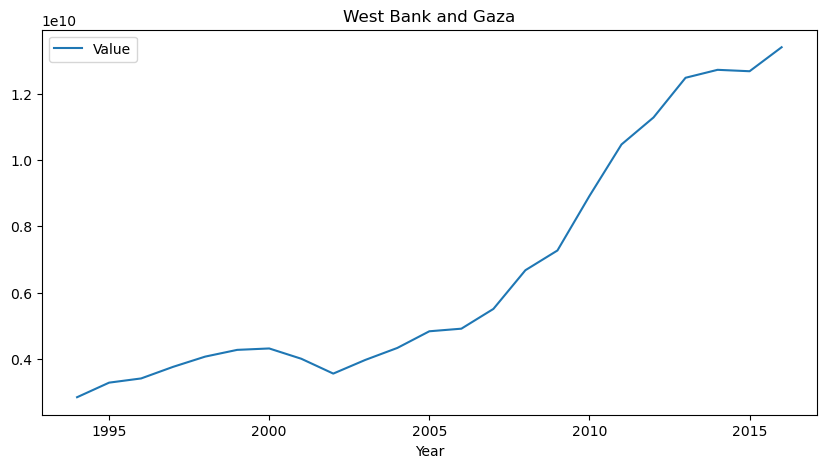

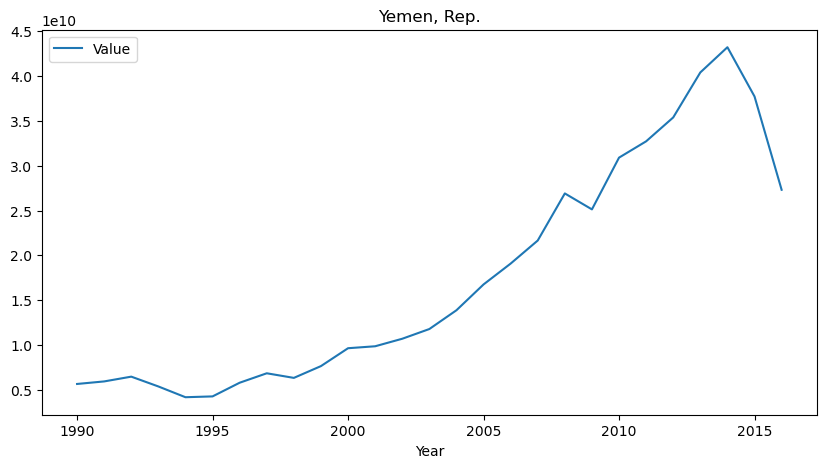

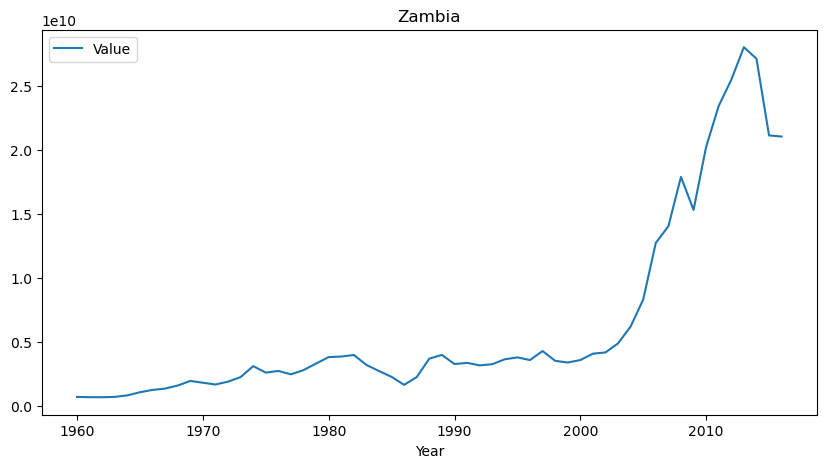

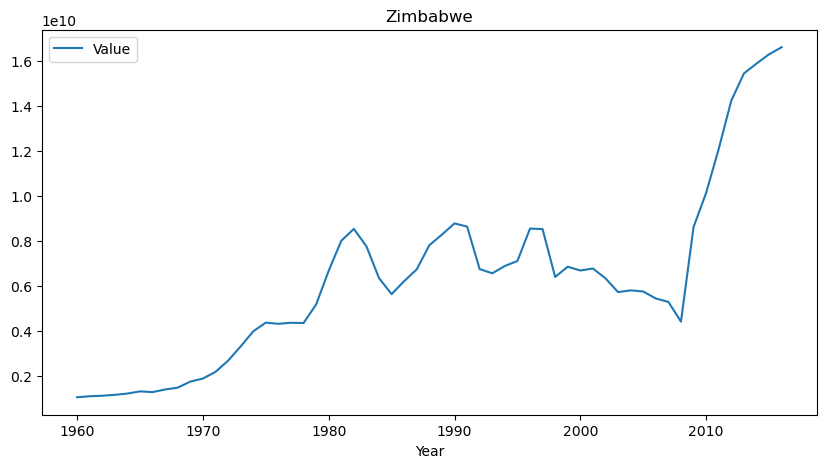

In [9]:
countries = df["Country_Name"].unique()
for country in countries:
    df_country = df[df["Country_Name"] == country]
    df_country.plot(kind = "line" , x = "Year" , y = "Value" , title = country , figsize = (10,5))

## GDP Growth per year for every Country

In [10]:
final_data = []
for country in df['Country_Name'].unique():
    df_pr = df[df["Country_Name"] == country]
    data = df_pr.values
    gdp_change = [0]
    for i in range(1,len(data)):
        gdp_change.append(round(((data[i][3] - data[i-1][3])/data[i][3])*100,2))
    df_pr = df_pr.assign(GDP = gdp_change)
    final_data.append(df_pr)

In [11]:
df = pd.concat(final_data , axis = 0)

In [12]:
df.head()

,Country_Name,Country_Code,Year,Value,GDP
0,Arab World,ARB,1968,2.576068e+10,0.00
1,Arab World,ARB,1969,2.843420e+10,9.40
2,Arab World,ARB,1970,3.138550e+10,9.40
3,Arab World,ARB,1971,3.642691e+10,13.84
4,Arab World,ARB,1972,4.331606e+10,15.90


In [13]:
df_pr = df[df["Country_Name"] == "India"]
fig = px.line(df_pr , x = "Year" , y = "GDP" , title = "India GDP Analysis")

In [14]:
fig

In [18]:
for country in df["Country_Name"].unique():
    df_pr1 = df[df["Country_Name"] == country]
    px.line(df_pr1 , x = "Year" , y = "GDP" , title = country + "GDP Analysis")

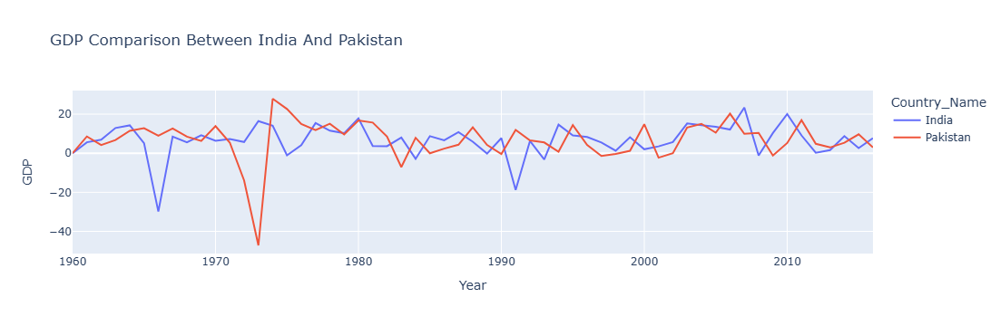

In [22]:
c1 = df[df["Country_Name"] == "India"]
c2 = df[df["Country_Name"] == "Pakistan"]

df_pr = pd.concat([c1 , c2] , axis = 0)
fig = px.line(df_pr , x = "Year" , y = "GDP" , title = "GDP Comparison Between India And Pakistan" , color = "Country_Name")
fig